# <center>S&P Global - Data Understanding </center>

**************************************************************************************************
@autor: Diego Babativa <br />
@date: 2022-10 <br />
@Description: This Data understanding notebook is the first data analysis approach <br />
**************************************************************************************************

**Objective:** Build a model to estimate production

**Dataset:** http://huy302.github.io/interview_dataset.csv

**Features description:** https://huy302.github.io/feature_desc.md

**Problem description:** Production prediction is one of the core problems in our business. The provided dataset is a set of nearby wells located in the United States and their 12 months cumulative production. As a data scientist you want to build a model from scratch to predict production and show your manager that your model can perform well on unseen data.

**Submitting material:** code (Python) and supporting materials if needed (analysis, documentation, paper, slide)
**************************************************************************************************

### 1. Loading Libreries

In [1]:
#import global libreries
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from dython.nominal import associations
pd.set_option('display.max_columns', None)

In [51]:
df_ = pd.read_csv('../../data/row/interview_dataset.csv')
df_.shape
df = df_.copy()

In [50]:
df_.head(4)

,treatment company,azimuth,md (ft),tvd (ft),date on production,operator,footage lateral length,well spacing,porpoise deviation,porpoise count,shale footage,acoustic impedance,log permeability,porosity,poisson ratio,water saturation,toc,vcl,p-velocity,s-velocity,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production
0,treatment company 1,-32.279999,19148,6443.0,3/1/2018,operator 1,11966.0,4368.46290,6.33,12,1093,30123.20,0.68,0.02,0.34,0.85,5.00,0.42,13592.23,6950.44,30.82,4149.0,NaN,83,56,21568792.0,1.23,5614.947951
1,treatment company 2,-19.799999,15150,7602.0,7/1/2014,operator 2,6890.0,4714.99220,1.28,4,0,30951.61,1.85,0.17,0.19,0.69,4.22,0.74,11735.04,7162.45,29.72,5776.0,NaN,102,33,9841307.0,1.47,2188.836707
2,treatment company 3,-26.879999,14950,5907.0,8/1/2018,operator 1,8793.0,798.92096,2.03,6,3254,28900.25,0.29,0.02,0.33,NaN,4.69,0.61,13227.81,6976.93,30.99,4628.0,NaN,88,62,17116240.0,1.67,1450.033022
3,treatment company 4,-49.099998,11098,6538.0,1/1/2012,operator 1,4234.0,NaN,6.00,23,7470,32826.08,0.73,0.03,0.20,NaN,4.40,0.56,12646.34,6799.37,26.20,4582.0,NaN,100,11,3749559.0,0.77,1060.764407


In [16]:
from dataprep.eda import create_report, plot, plot_correlation, plot_missing 

  0%|          | 0/5868 [00:00<?, ?it/s]

/home/diego/anaconda3/envs/spg/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/diego/anaconda3/envs/spg/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/diego/anaconda3/envs/spg/lib/python3.8/site-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/home/diego/anaconda3/envs/spg/lib/python3.8/site-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/home/diego/

DataPrep Report
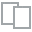
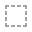
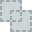
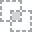
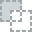
...
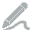
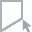
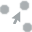
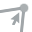
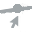

In [5]:
create_report(df)

### Insights:

1. Find out the posible correlation between operator and porpoise deviation and porpoise count
2. 

* Make correlation between names (categorical ) and numercial
* Search if linear regression and more complex models work with categorical or convert to one_hod_encodig or dummies.
* Check boxplot for each feature to reveal extreme values. Apply outliers managment.

In [18]:
#Checking if over these columns there are significant correlations.

#break_down_pressure
#water_saturation

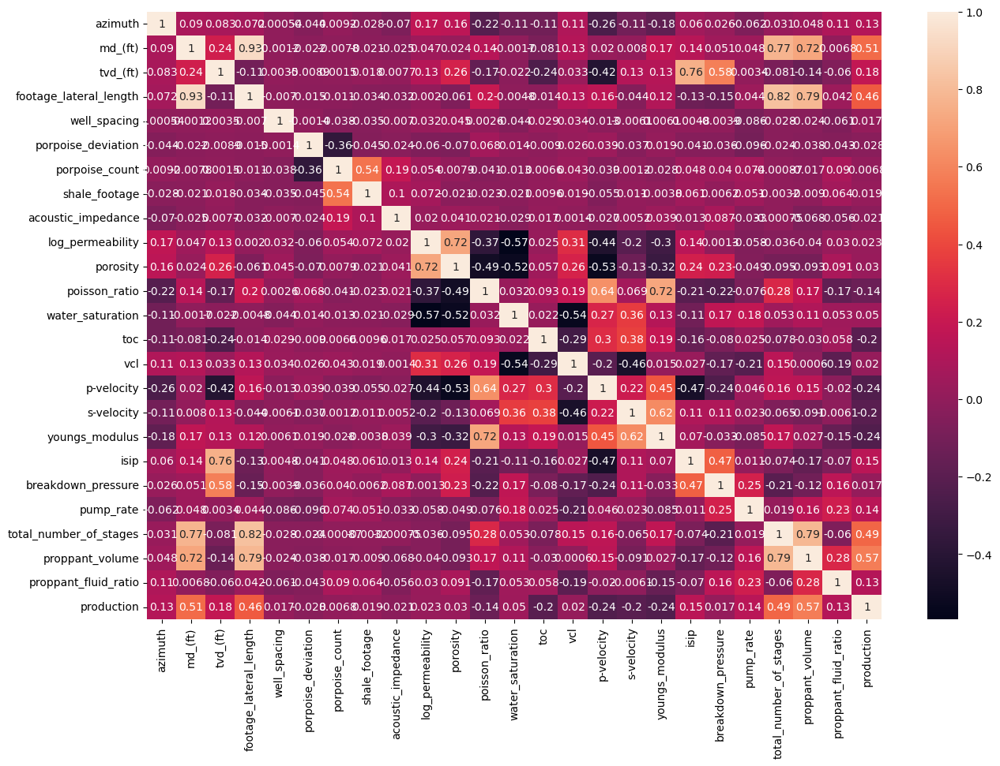

In [5]:
corrMatrix = df.corr()
plt.figure(figsize=(15, 10))
sn.heatmap(corrMatrix, annot=True)
plt.show()

#### Checking correlation between categorical and numerical variables. 

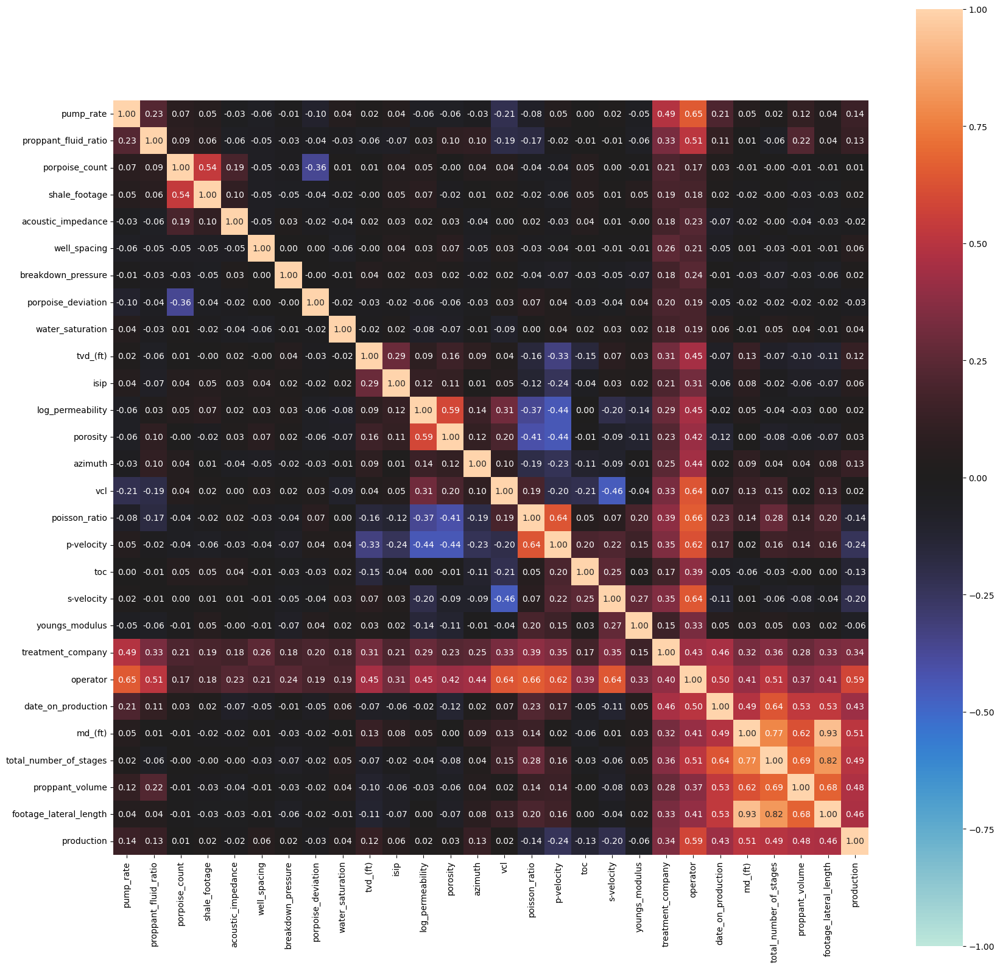

In [7]:
corr_all = associations(df.drop(columns=['date_on_production_Y_M']),
             nom_nom_assoc='theil',
             figsize=(20, 20), 
             clustering=True
            )

### 2. Fixing data types and compling missing values.

In [59]:
df = df_.copy()

In [60]:
# Rename columns name for convenience
df.columns = df.columns.str.replace(' ', '_')
df['date_on_production'] =  pd.to_datetime(df['date_on_production'])

#Adding new column to get only year_month from date_on_production
df['date_on_production_Y_M'] =  df['date_on_production'].dt.to_period('M')

#There are'nt significant correlations between 'break_down_pressure' and 'water_saturation' columns and the target variable with 
# other columns or target variable. We proceed to drop these columns.
df = df.drop(columns = ['breakdown_pressure', 'water_saturation'])

#Imputing missing values with median (minus affeted by outliers)(Before, looking for outliers presented)
missin_columns = (['azimuth', 'tvd_(ft)', 'well_spacing', 'porosity', 'toc','youngs_modulus','isip','proppant_volume'])
df[missin_columns] = df[missin_columns].apply(lambda x: x.fillna(x.mean()))

df['date_on_production_Y'] =  df['date_on_production'].dt.year

In [74]:
df[df['date_on_production_Y_M']=='2011-01'].shape

(20, 28)

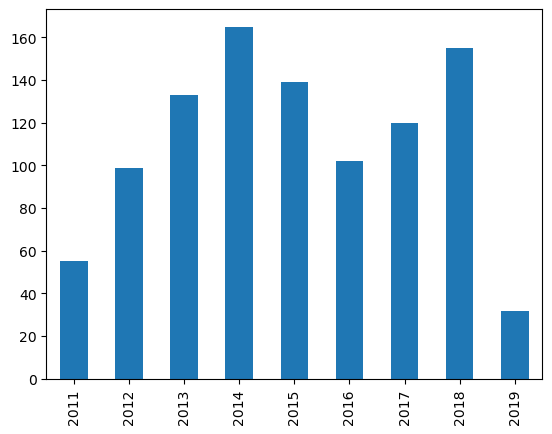

In [64]:
#Here, year & month projection graph
df['date_on_production_Y'].value_counts().sort_index().plot(kind='bar');

In [79]:
df.columns

Index(['treatment_company', 'azimuth', 'md_(ft)', 'tvd_(ft)',
       'date_on_production', 'operator', 'footage_lateral_length',
       'well_spacing', 'porpoise_deviation', 'porpoise_count', 'shale_footage',
       'acoustic_impedance', 'log_permeability', 'porosity', 'poisson_ratio',
       'toc', 'vcl', 'p-velocity', 's-velocity', 'youngs_modulus', 'isip',
       'pump_rate', 'total_number_of_stages', 'proppant_volume',
       'proppant_fluid_ratio', 'production', 'date_on_production_Y_M',
       'date_on_production_Y'],
      dtype='object')

In [81]:
to_remove = (
        ['date_on_production_Y_M',
        'date_on_production_Y']
)
df = df.drop(columns = to_remove)

In [83]:
df.to_parquet('../../data/proccessed/interview_dataset_processed.parquet')